# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [204]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
sns.set(style='whitegrid', font_scale=1.1)

random.seed(42)
np.random.seed(42)

In [205]:
!pip install ydata_profiling
from ydata_profiling import ProfileReport

In [206]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pickle
import os
import warnings
warnings.filterwarnings('ignore')

RANDOM_STATE = 42

In [207]:
def evaluate_model(y_true, y_pred):
  r2 = r2_score(y_true, y_pred)
  mse = MSE(y_true, y_pred)
  return r2, mse

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Сиды фиксируются для того, чтобы результаты при перезапуске ячейки были воспроизводимыми. В случае генерации псевдослучайных чисел будет всё время выводиться одно и то же число, если в ячейке зафиксирован сид.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [208]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

In [209]:
# 30 случайных строк тренировочного датасета

df_train.sample(30)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [210]:
# первые 5 объектов тестового датасета

df_test.head() # по умолчанию выводятся первые 5 строк

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [211]:
# последние 5 объектов тестового датасета

df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


**Выводы на основе выведенных случайных/верхних/нижних строк:**

- в датасете 13 признаков (включая целевую переменную), среди которых есть как числовые, так и категориальные
- при выводе 30 случайных строк можно увидеть наличие пропусков (`NaN`) в пяти последних столбцах
- значения в столбце `seats` (количество мест) представлены вещественными числами, хотя должны быть целочисленными; у некоторых объектов значение в этом столбце не заполнено (`NaN`), поэтому тип данных — `float`
- есть числовые признаки (`mileage`, `engine` и `max_power`), которые содержат не только числа, но и текст (_kmpl — kilometers per liter, км/л_; _CC — cubic centimeter, см³_, _bhp — brake horsepower, тормозная мощность двигателя_); нужно убрать текстовую часть, чтобы можно было работать со значениями в этих столбцах, как с числами

Только по выведенным строкам нельзя сделать выводы о распределении признаков, наличии/отсутствии дубликатов, точном количестве пропусков и столбцах, в которых они есть (пропущенные значения могли просто не попасть в случайно выведенные строки).

> **Дубликаты**

In [212]:
print(f'''Количество дубликатов (без учёта первого вхождения каждой дублирующейся строки):
• в тренировочном датасете: {df_train.duplicated().sum()}
• в тестовом датасете: {df_test.duplicated().sum()}''')

Количество дубликатов (без учёта первого вхождения каждой дублирующейся строки):
• в тренировочном датасете: 985
• в тестовом датасете: 62


Явные дубликаты выявлены как в тренировочном, так и в тестовом датасетах.

По умолчанию метод `.duplicated()` определяет как дубликаты те строки, в которых значения совпадают _во всех_ столбцах. Бывает так, что необходимо идентифицировать дубликаты, учитывая только часть признаков. Кроме того, в столбцах могут быть значения, которые содержат разное количество пробельных символов в начале/конце строки, слова в разных регистрах или какие-то опечатки, из-за чего такие строки будут считаться различными.

> **Дашборды**

In [213]:
profile_report_train = ProfileReport(df_train, title='Pandas Profiling Report (train)')
profile_report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 19.81it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [214]:
profile_report_train.to_file('report_train.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [215]:
profile_report_test = ProfileReport(df_test, title='Pandas Profiling Report (test)')
profile_report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 17.93it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [216]:
profile_report_test.to_file('report_test.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

- 4 из 13 столбцов (`year`, `selling_price`, `km_driven` и `seats`) имеют числовой тип данных
- наблюдается высокая корреляция между целевой переменной `selling_price` и признаками `year`, `transmission`
- явные пропуски есть в столбцах  `mileage`, `engine`, `max_power`, `torque` и `seats`

Количество дубликатов, полученное с помощью метода `.duplicated()` по тренировочному набору данных, равно 985, а в интерактивном отчёте дубликатов оказалось меньше — всего 493.

In [217]:
df_train[df_train.duplicated(keep=False)].drop_duplicates().shape

(493, 13)

В отчёте дубликаты считаются по количеству строк, которые не являются уникальными.

> **Пропущенные значения**

In [218]:
df_train.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [219]:
df_test.isna().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


**Пропущенные значения** обнаружены в тренировочном и тестовом датасетах в пяти столбцах `mileage`, `engine`, `max_power`, `torque` и `seats`.

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

🟢 Этот пункт 1-го задания корректнее выполнить **после удаления дубликатов**.

Если выполнять задания по порядку, то сначала рассчитываются медианные значения для столбцов `mileage`, `engine`, `max_power` и `seats`, а потом дубликаты, участвующие в расчёте медианы, удаляются.

При рассмотрении дубликатов в задании 2 целевая переменная не учитывается. В датасете есть автомобили с абсолютно одинаковыми значениями признаков, но разными значениями целевой переменной. Скорее всего, это возникло из-за ошибки ввода, так как полностью идентичные объекты (даже по признаку пробег `km_driven`) очень маловероятны.

### **Задание 2 (0.5 балла)**

На прошлом шаге вы рассмотрели дубликаты. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [220]:
print('Количество дубликатов в тренировочном датасете без учёта значений в столбце с целевой переменной: ', end='')
print(df_train.drop(columns='selling_price').duplicated().sum())

Количество дубликатов в тренировочном датасете без учёта значений в столбце с целевой переменной: 1159


In [221]:
df_train[df_train.drop(columns='selling_price').duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


В методе `drop_duplicates()` указываем `ignore_index=True` для сброса индекса. По умолчанию сохраняется первое вхождение строки, у которой есть дубли.

In [222]:
df_train = df_train.drop_duplicates(df_train.drop(columns='selling_price').columns,
                                    ignore_index=True)

In [223]:
assert df_train.shape == (5840, 13)

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [224]:
print(df_train['mileage'].str.contains(',', regex=False).sum(),
      df_train['max_power'].str.contains(',', regex=False).sum(),
      sep=', ')

# в столбцах mileage и max_power нет вещественных чисел, в которых десятичным разделителем является запятая

0, 0


В столбцах `mileage`, `engine` и `max_power` заменим на пустую строку всё, что не является цифрой и точкой. Точка в регулярном выражение экранирована (`\`), чтобы она воспринималась как обычный символ.

In [225]:
cols = ['mileage', 'engine', 'max_power']

for col in cols:
  df_train[col] = df_train[col].str.replace(r'[^\d\.]', '', regex=True)
  df_test[col] = df_test[col].str.replace(r'[^\d\.]', '', regex=True)

In [226]:
df_train[cols] = df_train[cols].apply(pd.to_numeric, downcast='float')
df_test[cols] = df_test[cols].apply(pd.to_numeric, downcast='float')

Проверим корректность типов данных после проведённых преобразований.

In [227]:
df_train[cols].dtypes

,0
mileage,float32
engine,float32
max_power,float32


In [228]:
df_test[cols].dtypes

,0
mileage,float32
engine,float32
max_power,float32


In [229]:
cols.append('seats')
cols

['mileage', 'engine', 'max_power', 'seats']

In [230]:
df_train[cols].describe()

,mileage,engine,max_power,seats
count,5654.000000,5654.000000,5656.000000,5654.00000
mean,19.432842,1435.418091,88.103065,5.44075
std,4.050995,492.452545,32.131908,0.99527
min,0.000000,624.000000,0.000000,2.00000
25%,16.799999,1197.000000,68.000000,5.00000
50%,19.369999,1248.000000,81.860001,5.00000
75%,22.320000,1498.000000,100.000000,5.00000
max,42.000000,3604.000000,400.000000,14.00000


В тренировочном датасете в столбцах `mileage` (показатель экономичности двигателя: сколько км может проехать автомобиль, израсходовав 1 л топлива) и `max_power` (максимальная мощность двигателя) обнаружены **нулевые значения**, которые не имеют физического смысла. Таких строк в тренировочном датасете _немного_ (17). В тестовом датасете нулевое значение встречается у одного объекта в столбце `mileage`.

В задании эти строки удалять не предполагается. Будем считать нули пропусками и также заполним их медианой.

In [231]:
df_train[(df_train['mileage'] == 0) | (df_train['max_power'] == 0)]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
476,Maruti Alto K10 LXI,2011,204999,97500,Petrol,Individual,Manual,First Owner,NaN,NaN,0.000000,NaN,NaN
533,Tata Indica Vista Aura Safire Anniversary Edition,2009,135000,28900,Petrol,Individual,Manual,Second Owner,0.0,1172.0,65.000000,"9.8@ 3,000(kgm@ rpm)",5.0
1112,Maruti Swift Dzire VDI Optional,2017,589000,41232,Diesel,Dealer,Manual,First Owner,NaN,NaN,0.000000,NaN,NaN
1276,Hyundai Santro Xing GL,2008,105000,128000,Petrol,Individual,Manual,First Owner,0.0,1086.0,62.000000,96.1Nm@ 3000rpm,5.0
1301,Mercedes-Benz M-Class ML 350 4Matic,2011,1700000,110000,Diesel,Individual,Automatic,Third Owner,0.0,2987.0,165.000000,510@ 1600-2400,5.0
1660,Land Rover Freelander 2 TD4 HSE,2013,1650000,64788,Diesel,Dealer,Automatic,First Owner,0.0,2179.0,115.000000,400 Nm /2000 rpm,5.0
1851,Hyundai Santro Xing (Non-AC),2010,110000,80000,Petrol,Individual,Manual,Second Owner,0.0,1086.0,62.099998,96.1Nm@ 3000rpm,5.0
2003,Tata Indica Vista Quadrajet LS,2012,240000,70000,Diesel,Individual,Manual,First Owner,NaN,NaN,0.000000,NaN,NaN
2114,Hyundai Santro Xing (Non-AC),2013,184000,15000,Petrol,Individual,Manual,First Owner,0.0,1086.0,62.099998,96.1Nm@ 3000rpm,5.0
3827,Hyundai Santro Xing GL,2008,175000,40000,Petrol,Individual,Manual,First Owner,0.0,1086.0,62.000000,96.1Nm@ 3000rpm,5.0


In [232]:
df_train[['mileage', 'max_power']] = df_train[['mileage', 'max_power']].replace(0, np.nan)

In [233]:
df_test[df_test['mileage'] == 0]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
130,Hyundai Santro Xing GL,2009,120000,90000,Petrol,Individual,Manual,Second Owner,0.0,1086.0,62.0,96.1Nm@ 3000rpm,5.0


In [234]:
df_test.loc[130, 'mileage'] = np.nan

Вычислим медианные значения в столбцах `mileage`, `engine`, `max_power`, `seats` по тренировочному набору данных, а пропуски заполним в тренировочном и в тестовом датасетах.

In [235]:
median_values = df_train[cols].median()
median_values

,0
mileage,19.400000
engine,1248.000000
max_power,81.860001
seats,5.000000


In [236]:
df_train[cols] = df_train[cols].fillna(dict(zip(cols, median_values)))
df_test[cols] = df_test[cols].fillna(dict(zip(cols, median_values)))

Убедимся, что пропусков не осталось.

In [237]:
df_train[cols].isna().sum()

,0
mileage,0
engine,0
max_power,0
seats,0


In [238]:
df_test[cols].isna().sum()

,0
mileage,0
engine,0
max_power,0
seats,0


Удалим столбец `torque` в тренировочном и тестовом наборах данных.

In [239]:
df_train = df_train.drop(columns='torque')
df_test = df_test.drop(columns='torque')

In [240]:
df_train.shape, df_test.shape

((5840, 12), (1000, 12))

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

Применим функцию `to_numeric()` к столбцам `engine` и `seats` с помощью метода `.apply()`, передав в неё именованный аргумент `downcast` со значением `integer`, чтобы преобразовать числовые данные к более компактному типу.

In [241]:
df_train[['engine', 'seats']] = df_train[['engine', 'seats']].apply(pd.to_numeric, downcast='integer')
df_test[['engine', 'seats']] = df_test[['engine', 'seats']].apply(pd.to_numeric, downcast='integer')

In [242]:
df_train[['engine', 'seats']].dtypes

,0
engine,int16
seats,int8


In [243]:
df_test[['engine', 'seats']].dtypes

,0
engine,int16
seats,int8


In [244]:
df_train.to_csv('train_car_prices.csv', index=False)

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [245]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.478302,1429.448973,87.948418,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.870465,485.662834,31.577858,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,9.000000,624.000000,32.799999,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,17.000000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.400000,1248.000000,81.860001,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.299999,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [246]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.358782,1454.87600,90.841675,5.403000
std,4.012149,7.585539e+05,48486.218662,3.904053,521.99574,34.893379,0.912921
min,1995.000000,3.100000e+04,1303.000000,9.500000,624.00000,34.200001,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.549999,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.400000,1248.00000,82.424999,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.299999,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.259998,3604.00000,280.000000,9.000000


In [247]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [248]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


- в обоих датасетах у признаков `selling_price`, `km_driven`, `engine`, `max_power`, `seats` средние значения несколько больше медианных; среднее более чувствительно к наличию экстремально больших значений; минимальное и максимальное значения в столбцах `selling_price` и	`km_driven` различаются на несколько порядков

- числовые признаки имеют разный масштаб

- в тренировочном наборе данных более широкий диапазон годов производства автомобилей (1983-2020), чем в тестовом (1995-2020)

- количество категорий в категориальных столбцах одинаковое и в тренировочном, и в тестовом датасетах; самые представленные категории совпадают для признаков `fuel` — _Diesel_ (дизельное топливо), `seller_type` — _Individual_ (продавец — частное лицо), `transmission` — _Manual_ (механическая коробка передач), `owner` — _First Owner_ (у автомобиля был один владелец); по встречаемости в столбце `name` лидируют автомобили марки _Maruti_

- в столбце `name` много уникальных значений (1924 в тренировочном датасете и 621 в тестовом); можно попробовать извлечь из него потенциально полезные признаки для предсказания цены, например, марку автомобиля

In [249]:
df_train.shape, df_test.shape

((5840, 12), (1000, 12))

In [250]:
# assert df_train.shape == (5840, 13)

# проверка не проходит, потому что в 3 задании столбец torque был удалён, и количество признаков равно 12

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

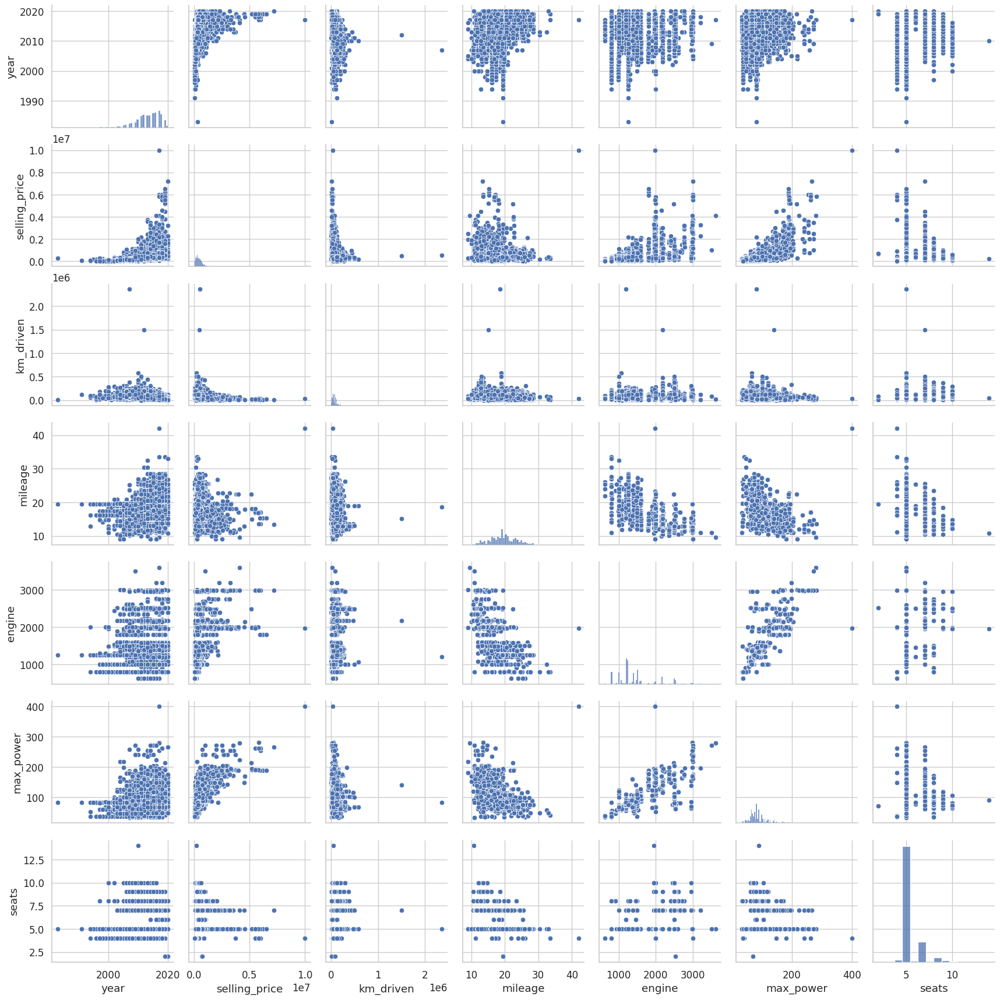

In [251]:
sns.pairplot(df_train);

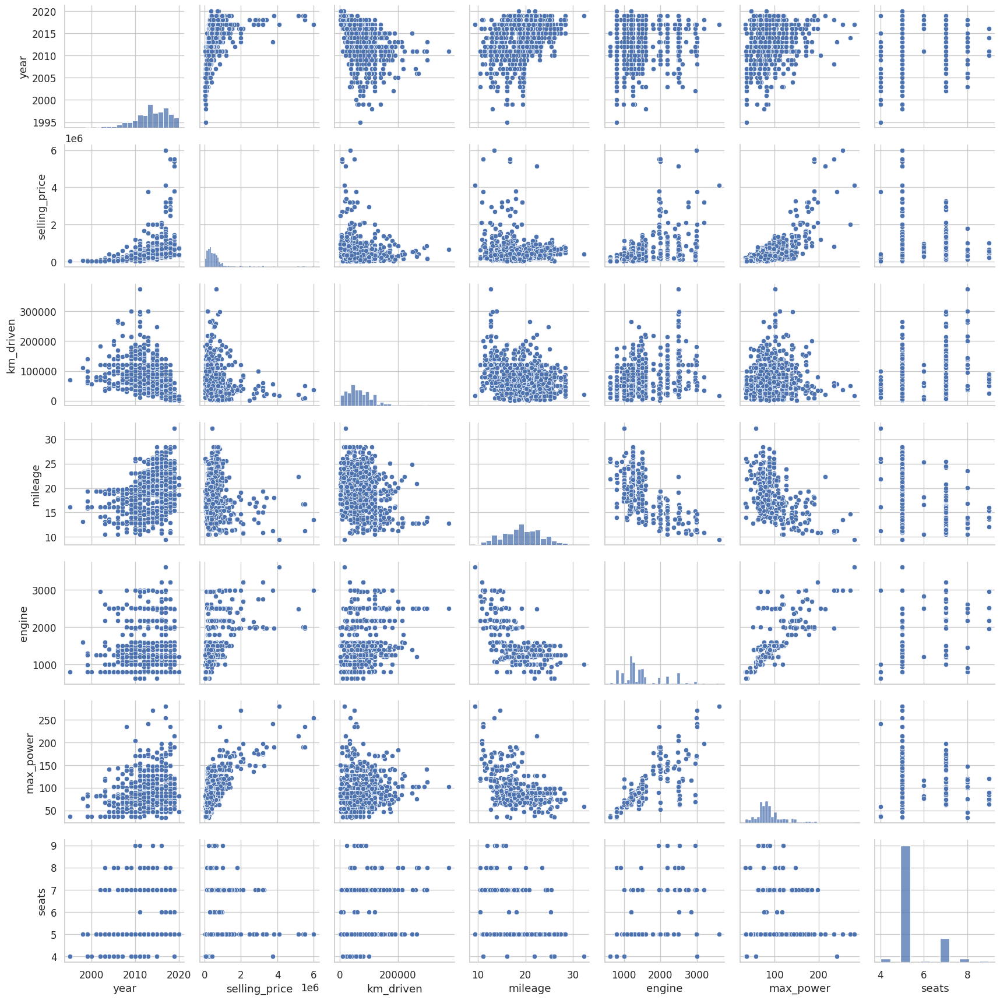

In [252]:
sns.pairplot(df_test);

На основе диаграмм рассеяния можно предположить наличие **линейной** взаимосвязи между целевой переменной (`selling_price`) и признаком `max_power` (максимальная мощность двигателя); прослеживается **нелинейная** связь целевой переменной с признаком `year` (год производства автомобиля).

Наличие линейной связи можно предположить между переменными `max_power` - `engine`, `mileage` - `engine`, `mileage` - `max_power`.

Распределения некоторых переменных **скошенные** (гистограммы на диагонали для тренировочной и тестовой выборок): влево для `year` и вправо для `selling_price` и `km_driven`.

При рассмотрении диаграмм рассеяния можно заметить различия между тренировочной и тестовой выборками в разбросе данных. Например, на диаграммах рассеяния для тренировочной выборки у переменной `km_driven` есть большие значения, сильно удалённые от основного скопления точек.


### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [253]:
corr_table = df_train.corr(numeric_only=True)
corr_table

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.348845,0.002819,0.157138,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.103404,0.447672,0.693742,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.190557,0.229766,0.024539,0.192328
mileage,0.348845,-0.103404,-0.190557,1.000000,-0.586140,-0.384647,-0.475093
engine,0.002819,0.447672,0.229766,-0.586140,1.000000,0.681968,0.652172
max_power,0.157138,0.693742,0.024539,-0.384647,0.681968,1.000000,0.244017
seats,0.041178,0.149953,0.192328,-0.475093,0.652172,0.244017,1.000000


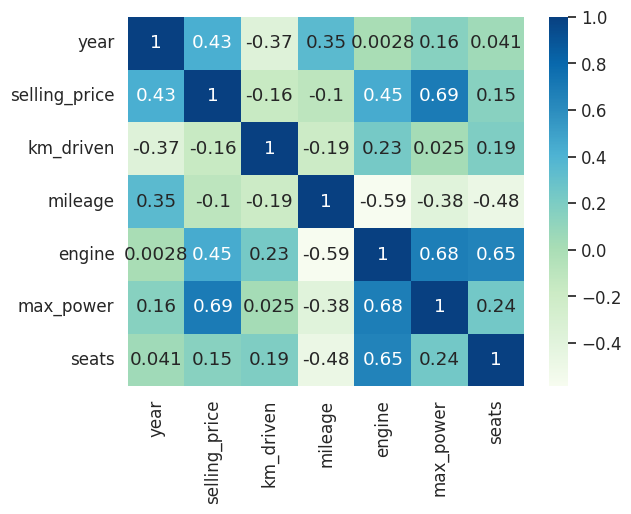

In [254]:
sns.heatmap(corr_table, annot=True, cmap='GnBu');

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

Между переменными `year` (год производства) и `engine` (объём двигателя) коэффициент корреляции Пирсона наименьший (**0,0028**).

Наиболее сильная **положительная** линейная корреляция наблюдается между признаками `max_power` (максимальная мощность двигателя) - `selling_price` (**0,69**), `engine` - `max_power` (**0,68**) и `engine` - `seats` (**0,65**), т.е. при увеличении одной переменной другая переменная в среднем также увеличивается.

Для признаков `km_driven` (пробег) - `year` коэффициент корреляции равен **-0,37**, что свидетельствует об умеренной **отрицательной** линейной связи между переменными.  Можно сказать, что пробег автомобиля при уменьшении года выпуска, скорее всего, будет увеличиваться, однако при таком значении коэффициента корреляции будет немало примеров, когда это будет не так. Возможно, в датасете есть ряд старых машин, которые редко использовались, поэтому они имеют небольшой пробег.

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

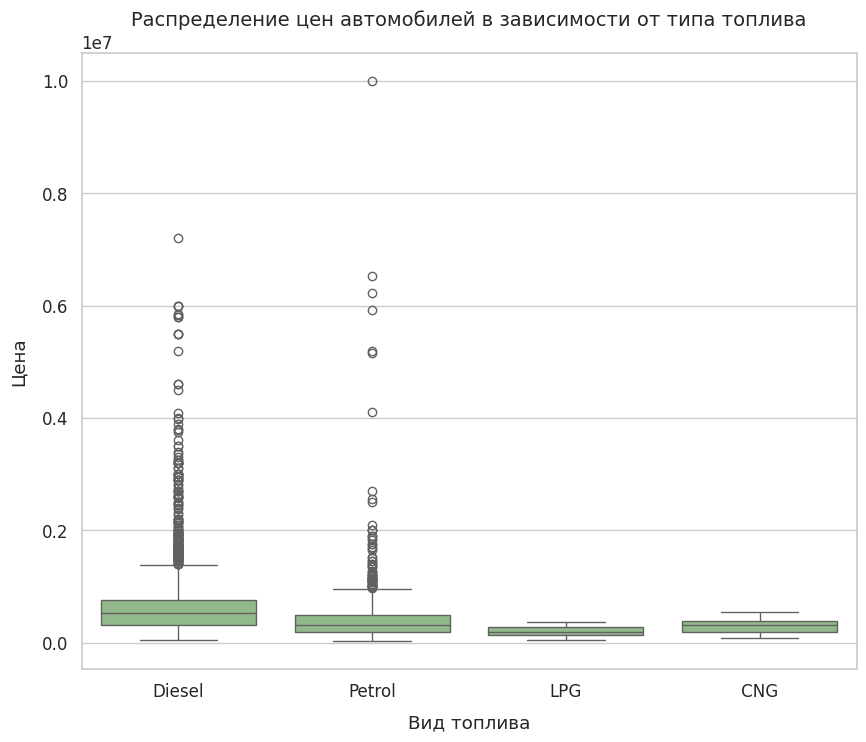

In [255]:
plt.figure(figsize=(10, 8))

sns.boxplot(data=df_train, x='fuel', y='selling_price', color='#8cc084')
plt.title('Распределение цен автомобилей в зависимости от типа топлива', pad=20, size=14)
plt.xlabel('Вид топлива', labelpad=10)
plt.ylabel('Цена', labelpad=10);

- в датасете представлены автомобили, которые работают на одном из четырёх видов топлива: _Diesel_ (дизельное), _Petrol_ (бензиновое), _LPG_ (сжиженный нефтяной газ), _CNG_ (сжатый природный газ)

- медианная цена самая высокая у автомобилей на дизельном топливе, а самая низкая — на _LPG_; цены у автомобилей на топливе _LPG_ наименее вариативны

- у автомобилей с типом топлива _Diesel_ и _Petrol_ большой разброс цен в верхней части данных, причём у одного автомобиля на бензиновом топливе очень высокая цена, по сравнению с остальными

In [256]:
df_train[df_train['selling_price'] == 10_000_000] # автомобиль с самой высокой ценой

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
151,Volvo XC90 T8 Excellence BSIV,2017,10000000,30000,Petrol,Individual,Automatic,First Owner,42.0,1969,400.0,4


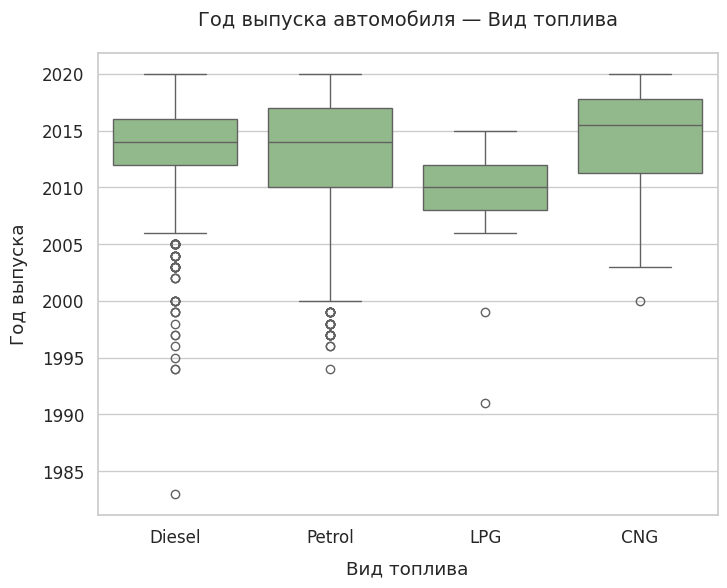

In [257]:
plt.figure(figsize=(8, 6))

sns.boxplot(data=df_train, x='fuel', y='year', color='#8cc084')
plt.title('Год выпуска автомобиля — Вид топлива', pad=20, size=14)
plt.xlabel('Вид топлива', labelpad=10)
plt.ylabel('Год выпуска', labelpad=10);

В датасете нет автомобилей на топливе _LPG_, выпущенных после 2015 года.

Автомобили с бензиновыми и дизельными двигателями представлены в широком диапазоне годов выпуска.

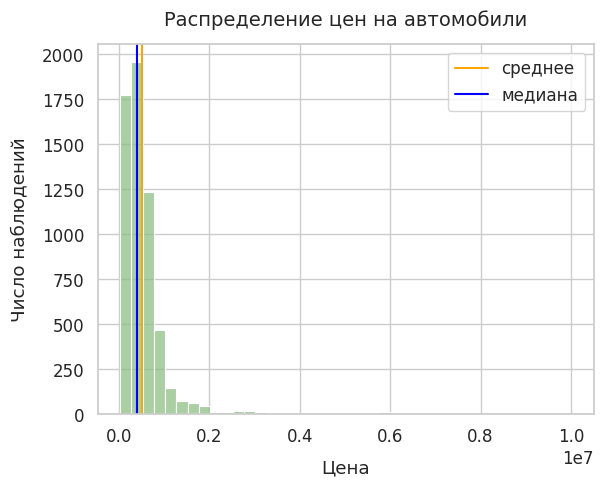

In [258]:
sns.histplot(df_train['selling_price'], bins=40, color='#8cc084')

plt.axvline(x=df_train['selling_price'].mean(), color='orange', label="среднее")
plt.axvline(x=df_train['selling_price'].median(), color='blue', label="медиана")

plt.title('Распределение цен на автомобили', size=14, pad=14)
plt.xlabel('Цена', labelpad=10)
plt.ylabel('Число наблюдений', labelpad=10)
plt.legend(["среднее", "медиана"]);

Распределение целевой переменной скошено вправо. В датасете есть автомобили с очень высокой ценой; среднее оказывается больше медианы.

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Сделайте тренировочный и тестовый наборы. Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test при разбиении. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

Матрица объект-признак будет содержать 6 числовых столбцов:

- `year` — год производства
- `km_driven` — пробег
- `mileage` — топливная экономичность
- `engine` — объём двигателя
- `max_power` — максимальная мощность двигателя
- `seats` — количество мест

Столбец с целевой переменной:
- `selling_price` — цена автомобиля

In [259]:
X_train_num = df_train.drop(columns='selling_price').select_dtypes('number')
X_test_num = df_test.drop(columns='selling_price').select_dtypes('number')

In [260]:
y_train = df_train['selling_price']
X_train = X_train_num

In [261]:
X_train.shape, y_train.shape

((5840, 6), (5840,))

In [262]:
X_train.head()

,year,km_driven,mileage,engine,max_power,seats
0,2014,145500,23.400000,1248,74.000000,5
1,2014,120000,21.139999,1498,103.519997,5
2,2010,127000,23.000000,1396,90.000000,5
3,2007,120000,16.100000,1298,88.199997,5
4,2017,45000,20.139999,1197,81.860001,5


In [263]:
y_test = df_test['selling_price']
X_test = X_test_num

In [264]:
X_test.shape, y_test.shape

((1000, 6), (1000,))

In [265]:
X_test.head()

,year,km_driven,mileage,engine,max_power,seats
0,2010,168000,14.0,2498,112.000000,7
1,2017,25000,21.5,1497,108.500000,5
2,2007,218463,12.9,1799,130.000000,5
3,2015,173000,25.1,1498,98.599998,5
4,2011,70000,16.5,1172,65.000000,5


### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [266]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

y_test_pred_lin_reg = lin_reg.predict(X_test)

In [267]:
r2_train, mse_train = evaluate_model(y_train, lin_reg.predict(X_train))

print(f'R^2 (train): {r2_train}\nMSE (train): {mse_train:,}')

R^2 (train): 0.5938773075766299
MSE (train): 116,410,333,725.66583


In [268]:
r2_test, mse_test = evaluate_model(y_test, y_test_pred_lin_reg)

print(f'R^2 (test): {r2_test}\nMSE (test): {mse_test:,}')

R^2 (test): 0.594452340942814
MSE (test): 233,120,375,098.39453


Идеальное значение для метрики $R^2$ равно 1.

$R^2$ имеет не очень высокие, но близкие значения на тренировочном и тестовом датасетах: ~ 0,5939 и ~ 0,5945.

Чем меньше значение $MSE$, тем лучше качество модели. $MSE$ на тестовом датасете выше. Значения $MSE$ получились очень большими из-за того, в этой задаче предсказываются цены на автомобили, диапазон которых очень широк, и разница между исходным и предсказанным значениями возводится в квадрат.

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [269]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=scaler.get_feature_names_out())
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=scaler.get_feature_names_out())

In [270]:
X_train_scaled.head()

,year,km_driven,mileage,engine,max_power,seats
0,0.139570,1.191152,1.013327,-0.373643,-0.441753,-0.434419
1,0.139570,0.766619,0.429366,0.141162,0.493159,-0.434419
2,-0.837167,0.883158,0.909971,-0.068879,0.064974,-0.434419
3,-1.569719,0.766619,-0.872920,-0.270682,0.007967,-0.434419
4,0.872122,-0.482007,0.170976,-0.478663,-0.192823,-0.434419


In [271]:
X_test_scaled.head()

,year,km_driven,mileage,engine,max_power,seats
0,-0.837167,1.565740,-1.415539,2.200379,0.761724,1.601702
1,0.872122,-0.814974,0.522386,0.139102,0.650878,-0.434419
2,-1.569719,2.405866,-1.699768,0.760986,1.331792,-0.434419
3,0.383754,1.648982,1.452590,0.141162,0.337340,-0.434419
4,-0.592983,-0.065798,-0.769564,-0.530144,-0.726787,-0.434419


In [272]:
lin_reg_1 = LinearRegression()
lin_reg_1.fit(X_train_scaled, y_train)

y_test_pred_lin_reg_1 = lin_reg_1.predict(X_test_scaled)

In [273]:
r2_train_1, mse_train_1 = evaluate_model(y_train, lin_reg_1.predict(X_train_scaled))

print(f'R^2 (train): {r2_train_1}\nMSE (train): {mse_train_1:,}')

R^2 (train): 0.5938773075766302
MSE (train): 116,410,333,725.66577


In [274]:
r2_test_1, mse_test_1 = evaluate_model(y_test, y_test_pred_lin_reg_1)

print(f'R^2 (test): {r2_test_1}\nMSE (test): {mse_test_1:,}')

R^2 (test): 0.5944523409428298
MSE (test): 233,120,375,098.3854


Псоле стандартизации значения метрик практически не изменились (разница лишь в последних цифрах после десятичной точки).

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [275]:
pd.Series(lin_reg_1.coef_, index=lin_reg_1.feature_names_in_, name='weights').sort_values(key=np.abs, ascending=False)

,weights
max_power,326181.381773
year,149106.938278
engine,60857.858640
km_driven,-44614.967130
mileage,36018.477786
seats,-19447.640113


Наиболее важным оказался признак `max_power`, у которого была выявлена самая сильная положительная линейная корреляция с целевой переменной.

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [276]:
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

y_test_pred_lasso = lasso.predict(X_test_scaled)

In [277]:
r2_train_lasso, mse_train_lasso = evaluate_model(y_train, lasso.predict(X_train_scaled))

print(f'R^2 (train): {r2_train_lasso}\nMSE (train): {mse_train_lasso:,}')

R^2 (train): 0.5938773075415049
MSE (train): 116,410,333,735.73401


In [278]:
r2_test_lasso, mse_test_lasso = evaluate_model(y_test, y_test_pred_lasso)

print(f'R^2 (test): {r2_test_lasso}\nMSE (test): {mse_test_lasso:,}')

R^2 (test): 0.5944511965819816
MSE (test): 233,121,032,909.67892


Метрики качества снова практически не изменились.

In [279]:
pd.Series(lasso.coef_, index=lasso.feature_names_in_, name='weights').sort_values(key=np.abs, ascending=False)

,weights
max_power,326182.234993
year,149106.794122
engine,60853.048034
km_driven,-44613.836830
mileage,36016.571750
seats,-19444.827965


L1-регуляризация не всегда приводит к занулению весов. Может быть, все признаки действительно важны, и их не требуется исключать. Кроме того, нужно пробовать подбирать коэффициент регуляризации, потому что значение по умолчанию может быть неоптимальным.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [280]:
cv = KFold(n_splits=10, shuffle=True, random_state=RANDOM_STATE)

In [281]:
alpha_values = [1.e-05, 1.e-03, 1.e-01, 1.e+00, 1.e+01, 1.e+03, 1.e+05]

In [282]:
lasso_1 = Lasso()
params_lasso = {'alpha': alpha_values}

gs_lasso = GridSearchCV(lasso_1, params_lasso, verbose=1, cv=cv, scoring='r2')
gs_lasso.fit(X_train_scaled, y_train)
gs_lasso.best_params_, gs_lasso.best_score_

Fitting 10 folds for each of 7 candidates, totalling 70 fits


({'alpha': 1000.0}, np.float64(0.5903523213701038))

In [283]:
gs_lasso.best_estimator_ # лучшая модель

Lasso(alpha=1000.0)

In [284]:
r2_train_lasso_1, mse_train_lasso_1 = evaluate_model(y_train, gs_lasso.best_estimator_.predict(X_train_scaled))

print(f'R^2 (train): {r2_train_lasso_1}\nMSE (train): {mse_train_lasso_1:,}')

R^2 (train): 0.5938430953402365
MSE (train): 116,420,140,264.25716


In [285]:
y_test_pred_lasso_1 = gs_lasso.best_estimator_.predict(X_test_scaled)

In [286]:
r2_test_lasso_1, mse_test_lasso_1 = evaluate_model(y_test, y_test_pred_lasso_1)

print(f'R^2 (test): {r2_test_lasso_1}\nMSE (test): {mse_test_lasso_1:,}')

R^2 (test): 0.5932919738497087
MSE (test): 233,787,387,238.53467


In [287]:
pd.Series(gs_lasso.best_estimator_.coef_, index=X_train_scaled.columns, name='weights').sort_values(key=np.abs, ascending=False)

,weights
max_power,327023.159218
year,148905.705641
engine,56130.929317
km_driven,-43510.982266
mileage,34196.112795
seats,-16640.108673


Использовалось 10 фолдов, и при каждом заданном значении гиперпараметра `alpha` модель обучалась 10 раз на 9-ти из 10-ти фолдов, а на оставшемся валидационном фолде оценивалось её качество. Итого 10 нужно умножить на количество значений гиперпараметра `alpha`: 10 * 7 = 70 моделей. После окончания подбора гиперпараметров модель с лучшим значением `r2_score`, усреднённым по валидационным фолдам, обучается заново на всём тренировочном датасете, и мы получаем готовую модель.

Лучший коэффициент регуляризации равен 1000. Однако улучшений по метрикам на тренировочном и тестовом наборах данных не наблюдается, оно даже стало немного хуже.

Веса не занулились. Абсолютные значения всех весов, кроме `max_power`, уменьшились.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

`l1_ratio` определяет соотношение между двумя типами регуляризации:

- `l1_ratio = 0` => L2

- `l1_ratio = 1` => L1

- `0 < l1_ratio < 1` => комбинация L1 и L2

In [288]:
elasticnet = ElasticNet()
params_elasticnet = {'alpha': alpha_values,
                     'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 0.99]}

gs_elasticnet = GridSearchCV(elasticnet, params_elasticnet, verbose=1, cv=cv, scoring='r2')
gs_elasticnet.fit(X_train_scaled, y_train)
gs_elasticnet.best_params_, gs_elasticnet.best_score_

Fitting 10 folds for each of 42 candidates, totalling 420 fits


({'alpha': 0.1, 'l1_ratio': 0.5}, np.float64(0.5911802455903649))

In [289]:
r2_train_elasticnet, mse_train_elasticnet = evaluate_model(y_train, gs_elasticnet.best_estimator_.predict(X_train_scaled))

print(f'R^2 (train): {r2_train_elasticnet}\nMSE (train): {mse_train_elasticnet:,}')

R^2 (train): 0.5927001032535195
MSE (train): 116,747,765,616.74991


In [290]:
y_test_pred_elasticnet = gs_elasticnet.best_estimator_.predict(X_test_scaled)

In [291]:
r2_test_elasticnet, mse_test_elasticnet = evaluate_model(y_test, y_test_pred_elasticnet)

print(f'R^2 (test): {r2_test_elasticnet}\nMSE (test): {mse_test_elasticnet:,}')

R^2 (test): 0.5835141458516722
MSE (test): 239,407,961,983.92712


In [292]:
pd.Series(gs_elasticnet.best_estimator_.coef_, index=X_train_scaled.columns, name='weights').sort_values(key=np.abs, ascending=False)

,weights
max_power,302095.330224
year,146741.434172
engine,73155.714036
km_driven,-45728.966016
mileage,31667.751187
seats,-22234.145849


Количество комбинаций значений гиперпараметров: 7 * 6 = 42. При умножении на 10 получаем 420 моделей.

Значения подобранных гиперпараметров:
- `alpha = 0,1`
- `l1_ratio = 0,5`

Метрики ухудшились и на тренировочном, и на тестовом наборах данных.

Если сравнить веса с теми, которые были получены при использовании Lasso-регрессии, то их абсолютные значения увеличились для признаков `engine`, `km_driven`, `seats`, а для `max_power`, `year` и `mileage` уменьшились.

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

In [293]:
print(f'Количество уникальных значений в столбце "name": {df_train["name"].nunique()}')

Количество уникальных значений в столбце "name": 1924


Приведём тексты в столбце `name` к нижнему регистру и извлечём автомобильные марки.

In [294]:
car_brands_train = df_train['name'].apply(lambda x: x.lower().split()[0])
car_brands_train.value_counts()

,count
name,
maruti,1804
hyundai,1058
mahindra,611
tata,534
toyota,309
ford,308
honda,308
chevrolet,188
renault,171


In [295]:
print(f'Количество автомобильных марок в тренировочном датасете: {car_brands_train.value_counts().shape[0]}')

Количество автомобильных марок в тренировочном датасете: 30


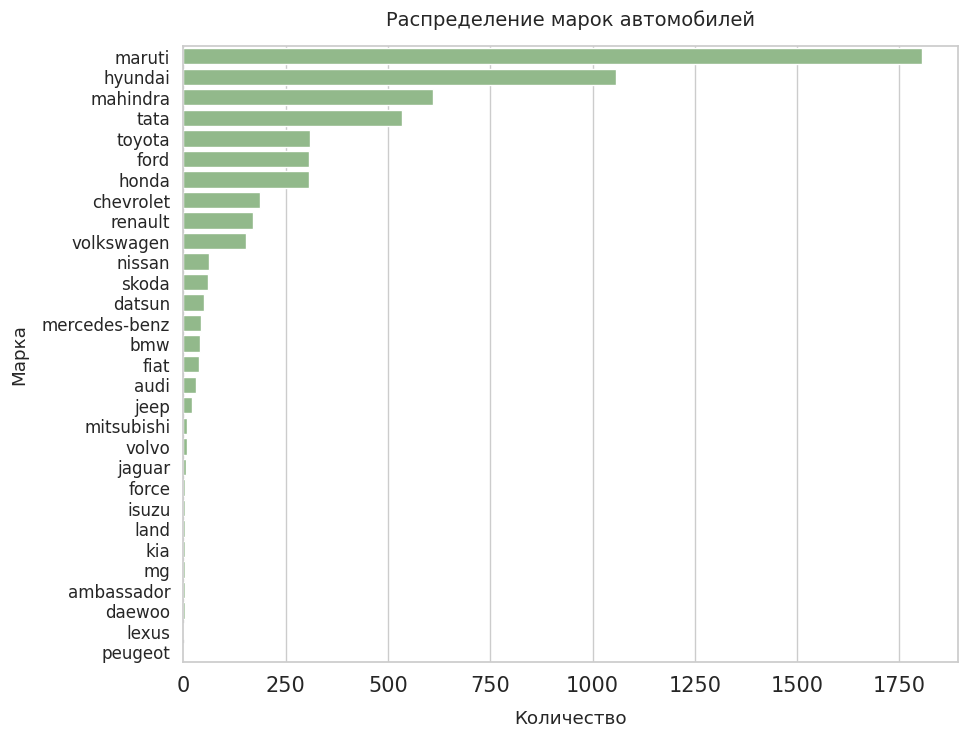

In [296]:
plt.figure(figsize=(10, 8))

sns.barplot(x=car_brands_train.value_counts(), y=car_brands_train.value_counts().index, color='#8cc084')
plt.xticks(size=15)
plt.title('Распределение марок автомобилей', pad=15, size=14)
plt.xlabel('Количество', labelpad=10)
plt.ylabel('Марка', labelpad=10);

В датасете преобладают автомобили индийской марки _Maruti_.

Есть **малопредставленные** марки, которые встречаются 8 и менее раз.

In [297]:
# марки для тестовой выборки
car_brands_test = df_test['name'].apply(lambda x : x.lower().split()[0])

In [298]:
# assert X_train_cat.shape == (5840, 10)

In [299]:
features = ['fuel', 'seller_type', 'transmission', 'owner', 'seats']

Признак `seats` будет кодироваться OneHot-методом, поэтому возьмём столбец `seats` из датафрейма до стандартизации признаков (с целыми значениями). Остальные числовые признаки оставляем стандартизированными и добавляем к ним категориальные признаки.

In [300]:
X_train_cat = pd.concat([X_train_scaled.drop(columns='seats'), df_train[features], car_brands_train], axis=1)
X_train_cat.head()

# X_train_scaled.drop(columns='seats') удаляем из датафрейма со стандартизированными признаками столбец seats
# df_train[features] из исходного загруженного датафрейма выбираем категориальные признаки, перечисленные в списке features
# добавляем столбец car_brands_train с марками автомобилей из тренировочного набора данных

,year,km_driven,mileage,engine,max_power,fuel,seller_type,transmission,owner,seats,name
0,0.139570,1.191152,1.013327,-0.373643,-0.441753,Diesel,Individual,Manual,First Owner,5,maruti
1,0.139570,0.766619,0.429366,0.141162,0.493159,Diesel,Individual,Manual,Second Owner,5,skoda
2,-0.837167,0.883158,0.909971,-0.068879,0.064974,Diesel,Individual,Manual,First Owner,5,hyundai
3,-1.569719,0.766619,-0.872920,-0.270682,0.007967,Petrol,Individual,Manual,First Owner,5,maruti
4,0.872122,-0.482007,0.170976,-0.478663,-0.192823,Petrol,Individual,Manual,First Owner,5,hyundai


In [301]:
# аналогично для тестового набора данных

X_test_cat = pd.concat([X_test_scaled.drop(columns='seats'), df_test[features], car_brands_test], axis=1)
X_test_cat.head()

,year,km_driven,mileage,engine,max_power,fuel,seller_type,transmission,owner,seats,name
0,-0.837167,1.565740,-1.415539,2.200379,0.761724,Diesel,Individual,Manual,First Owner,7,mahindra
1,0.872122,-0.814974,0.522386,0.139102,0.650878,Diesel,Individual,Manual,First Owner,5,tata
2,-1.569719,2.405866,-1.699768,0.760986,1.331792,Petrol,Individual,Automatic,First Owner,5,honda
3,0.383754,1.648982,1.452590,0.141162,0.337340,Diesel,Individual,Manual,First Owner,5,honda
4,-0.592983,-0.065798,-0.769564,-0.530144,-0.726787,Petrol,Individual,Manual,Second Owner,5,tata


In [302]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,name
count,5840,5840,5840,5840,5840
unique,4,3,2,5,30
top,Diesel,Individual,Manual,First Owner,maruti
freq,3177,5223,5336,3603,1804


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [303]:
X_train_cat.shape

(5840, 11)

In [304]:
features.append('name')

Чтобы не создавать отдельные столбцы для тех значений признаков, которые встречаются весьма редко (< 10 раз - от общего количества объектов такие категории будут составлять меньше 0,2 %), добавим параметр `min_frequency=10` в `OneHotEncoder` для группировки редких значений в одну категорию.

In [305]:
ohe = OneHotEncoder(drop='first', min_frequency=10, handle_unknown='ignore', sparse_output=False)
ohe.fit(X_train_cat[features])

OneHotEncoder(drop='first', handle_unknown='ignore', min_frequency=10,
              sparse_output=False)

In [306]:
new_features = ohe.get_feature_names_out()
new_features

array(['fuel_Diesel', 'fuel_LPG', 'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Third Owner', 'owner_infrequent_sklearn', 'seats_5',
       'seats_6', 'seats_7', 'seats_8', 'seats_9', 'seats_10',
       'seats_infrequent_sklearn', 'name_bmw', 'name_chevrolet',
       'name_datsun', 'name_fiat', 'name_ford', 'name_honda',
       'name_hyundai', 'name_jeep', 'name_mahindra', 'name_maruti',
       'name_mercedes-benz', 'name_nissan', 'name_renault', 'name_skoda',
       'name_tata', 'name_toyota', 'name_volkswagen',
       'name_infrequent_sklearn'], dtype=object)

In [307]:
X_train_new = pd.concat([X_train_cat.drop(columns=features), # оставляем стандартизированные числовые признаки, а категориальные удаляем
                         pd.DataFrame(ohe.transform(X_train_cat[features]), # преобразуем категориальные признаки (OneHot)
                         columns=new_features)],
                         axis=1)

In [308]:
X_train_new.head()

,year,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,seller_type_Trustmark Dealer,...,name_mahindra,name_maruti,name_mercedes-benz,name_nissan,name_renault,name_skoda,name_tata,name_toyota,name_volkswagen,name_infrequent_sklearn
0,0.139570,1.191152,1.013327,-0.373643,-0.441753,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.139570,0.766619,0.429366,0.141162,0.493159,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-0.837167,0.883158,0.909971,-0.068879,0.064974,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-1.569719,0.766619,-0.872920,-0.270682,0.007967,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.872122,-0.482007,0.170976,-0.478663,-0.192823,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [309]:
# для тестового набора данных

X_test_new = pd.concat([X_test_cat.drop(columns=features),
                       pd.DataFrame(ohe.transform(X_test_cat[features]),
                       columns=new_features)],
                       axis=1)

In [310]:
X_test_new.head()

,year,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,seller_type_Trustmark Dealer,...,name_mahindra,name_maruti,name_mercedes-benz,name_nissan,name_renault,name_skoda,name_tata,name_toyota,name_volkswagen,name_infrequent_sklearn
0,-0.837167,1.565740,-1.415539,2.200379,0.761724,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.872122,-0.814974,0.522386,0.139102,0.650878,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,-1.569719,2.405866,-1.699768,0.760986,1.331792,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.383754,1.648982,1.452590,0.141162,0.337340,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.592983,-0.065798,-0.769564,-0.530144,-0.726787,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [311]:
ridge = Ridge(random_state=RANDOM_STATE)

params_ridge = {'alpha': alpha_values}

gs_ridge = GridSearchCV(ridge, params_ridge, n_jobs=-1, verbose=1, cv=cv, scoring='r2')
gs_ridge.fit(X_train_new, y_train)
gs_ridge.best_params_, gs_ridge.best_score_

Fitting 10 folds for each of 7 candidates, totalling 70 fits


({'alpha': 1e-05}, np.float64(0.7282238823161901))

In [312]:
r2_train_ridge, mse_train_ridge = evaluate_model(y_train, gs_ridge.best_estimator_.predict(X_train_new))

print(f'R^2 (train): {r2_train_ridge}\nMSE (train): {mse_train_ridge:,}')

R^2 (train): 0.7545331431772178
MSE (train): 70,360,211,961.61554


In [313]:
y_test_pred_ridge = gs_ridge.best_estimator_.predict(X_test_new)

In [314]:
r2_test_ridge, mse_test_ridge = evaluate_model(y_test, y_test_pred_ridge)

print(f'R^2 (test): {r2_test_ridge}\nMSE (test): {mse_test_ridge:,}')

R^2 (test): 0.7403993823057488
MSE (test): 149,225,848,112.03442


Оптимальное значение гиперпараметра `alpha`: 1e-05.

Добавление закодированных категориальных признаков улучшило метрики качества.

Метрика $R^2$ увеличилась, а $MSE$ уменьшилась и на тренировочном, и на тестовом наборах данных. На тренировочном наборе метрика получилась немного выше, но значения всё равно довольно близкие (~ 0,75 и ~ 0,74).

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [315]:
models = ['lin_reg', 'lin_reg_1', 'lasso', 'lasso_1', 'elasticnet', 'ridge']

predictions = [y_test_pred_lin_reg, y_test_pred_lin_reg_1, y_test_pred_lasso,
               y_test_pred_lasso_1, y_test_pred_elasticnet, y_test_pred_ridge]

In [316]:
def business_metric(y_true, y_pred):
  return (sum(np.abs((y_test - y_pred) / y_test) * 100 <= 10)) / len(y_test)

In [317]:
for p, m in zip(predictions, models):
  print(f'{m}: {business_metric(y_test, p)}')
  print('-' * 17)

lin_reg: 0.232
-----------------
lin_reg_1: 0.232
-----------------
lasso: 0.232
-----------------
lasso_1: 0.231
-----------------
elasticnet: 0.243
-----------------
ridge: 0.297
-----------------


Показатели довольно низкие. Лучший результат получился у модели Ridge-регрессии, обученной в задании 16 (0,297).

In [318]:
pd.DataFrame({'model': ['lin_reg', 'lin_reg_1 (scaled)', 'lasso (scaled)',
                        'lasso_1 (scaled, alpha: 1000)',
                        'elasticnet (scaled, alpha: 0.1, l1_ratio: 0.5)',
                        'ridge (scaled + cat. features, alpha: 1e-05)'],

              'r2_train': [0.59, 0.59, 0.59, 0.59, 0.59, 0.75],

              'r2_test': [0.59, 0.59, 0.59, 0.59, 0.58, 0.74],

              'mse_train': [mse_train, mse_train_1, mse_train_lasso, mse_train_lasso_1,
                            mse_train_elasticnet, mse_train_ridge],

              'mse_test': [mse_test, mse_test_1, mse_test_lasso, mse_test_lasso_1,
                           mse_test_elasticnet, mse_test_ridge],

              'business_metric': [0.23, 0.23, 0.23, 0.23, 0.24, 0.30]})

,model,r2_train,r2_test,mse_train,mse_test,business_metric
0,lin_reg,0.59,0.59,1.164103e+11,2.331204e+11,0.23
1,lin_reg_1 (scaled),0.59,0.59,1.164103e+11,2.331204e+11,0.23
2,lasso (scaled),0.59,0.59,1.164103e+11,2.331210e+11,0.23
3,"lasso_1 (scaled, alpha: 1000)",0.59,0.59,1.164201e+11,2.337874e+11,0.23
4,"elasticnet (scaled, alpha: 0.1, l1_ratio: 0.5)",0.59,0.58,1.167478e+11,2.394080e+11,0.24
5,"ridge (scaled + cat. features, alpha: 1e-05)",0.75,0.74,7.036021e+10,1.492258e+11,0.30


По $R^2$, $MSE$ и по бизнес-метрике Ridge-регрессия, обученная на масштабированных числовых признаках и категориальных признаках, закодированных с помощью OneHot метода, оказалась лучшей моделью. Коэффициент детерминации $R^2$, равный 0,74, означает, что ~ 74 % дисперсии целевой переменной объясняется моделью, а оставшаяся часть объясняется какими-то другими факторами.

# **Создание пайплайна для обработки данных и обучения модели**

In [319]:
# загрузка исходного тренировочного датасета
df_train_1 = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')

In [320]:
# удаление дубликатов из тренировочного набора данных
df_train_1 = df_train_1.drop_duplicates(df_train_1.drop(columns='selling_price').columns, ignore_index=True)
df_train_1.shape

(5840, 13)

In [321]:
# 17 нулевых значений заменяем на `np.nan`, в пайплайне заполнятся медианой
indx = df_train_1[(df_train_1['mileage'].str.contains(r'^\s*0.*', regex=True, na=False)) | (df_train_1['max_power'].str.contains(r'^\s*0.*', regex=True, na=False))].index
indx

Index([ 476,  533, 1112, 1276, 1301, 1660, 1851, 2003, 2114, 3827, 4254, 4257,
       4305, 4761, 4805, 4952, 5327],
      dtype='int64')

In [322]:
df_train_1 = df_train_1[~df_train_1.index.isin(indx)]
df_train_1.shape

(5823, 13)

In [323]:
y_train_1 = df_train_1['selling_price']
X_train_1 = df_train_1.drop(columns='selling_price')

In [324]:
X_train_1.shape, y_train_1.shape

((5823, 12), (5823,))

Теперь можно проводить преобразования, которые будут применяться как к тренировочному, так и к тестовому наборам данных.

In [325]:
X_train_1.head()

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0


Для удобства объединим этапы обработки числовых и категориальных признаков, а также обучение модели Ridge-регрессии с подобранными гиперпараметрами в одном пайплайне.

In [326]:
num_features = ['year', 'km_driven']
cat_features = ['fuel', 'seller_type', 'transmission', 'owner']
features_with_text = ['mileage', 'engine', 'max_power']
seats_col = ['seats']
name_col = ['name']

Напишем функции для извлечения марки автомобиля из столбца `name` (`extract_brand_name`), преобразования типов данных (`convert_dtypes`) и удаления единиц измерения из столбцов `mileage`, `engine` и `max_power` (`extract_number`).


In [327]:
def extract_brand_name(X):
  X = pd.DataFrame(X).copy()
  X.iloc[:, 0] = X.iloc[:, 0].apply(lambda x: x.lower().split()[0])
  return X

def convert_dtypes(X, data_type):
  X = pd.DataFrame(X).copy()
  if isinstance(data_type, list):
    for i, col in enumerate(X.columns):
      X[col] = pd.to_numeric(X[col], downcast=data_type[i], errors='coerce')
    return X

  for col in X.columns:
      X[col] = pd.to_numeric(X[col], downcast=data_type, errors='coerce')
  return X

def extract_number(X):
  X = pd.DataFrame(X).copy()
  for col in X.columns:
    if X[col].dtype == 'object':
      X[col] = X[col].str.replace(r'[^\d\.]', '', regex=True)
  return X

В новых данных пропуски могут быть и в тех столбцах, с которыми всё было в порядке в тренировочном датасете. Поэтому лучше предусмотреть наличие явных пропусков (`NaN`) в остальных столбцах.



In [328]:
# пропуски в категориальных столбцах `fuel`, `seller_type`, `transmission` и `owner` заполняются значением 'NA' (неизвестная категория)
# признаки кодируются методом OneHot
cat_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='constant', fill_value='NA')),
                                  ('onehot_encoder', OneHotEncoder(drop='first', min_frequency=10, handle_unknown='ignore', sparse_output=False))])

# пропуски в столбце `seats` заполняются медианой
# тип данных `float` преобразуется к `int`
# признак кодируется методом OneHot
seats_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                    ('dtype_converter', FunctionTransformer(func=convert_dtypes, feature_names_out='one-to-one', kw_args={'data_type': 'integer'})),
                                    ('onehot_encoder', OneHotEncoder(drop='first', min_frequency=10, handle_unknown='ignore', sparse_output=False))])


# для значений в столбцах `mileage`, `engine` и `max_power` удаляются единицы измерения и происходит преобразование значений к типу `float`
# пропуски заполняются медианой
# признаки масштабируются
num_with_text_transformer = Pipeline(steps=[('cleaner', FunctionTransformer(func=extract_number, feature_names_out='one-to-one')),
                                            ('dtype_converter', FunctionTransformer(func=convert_dtypes, feature_names_out='one-to-one',
                                                                                    kw_args={'data_type': ['float', 'integer', 'float']})),
                                            ('imputer', SimpleImputer(strategy='median')),
                                            ('scaler', StandardScaler())])

# для числовых признаков `year` и `km_driven` пропуски (если есть) будут заполняться медианой, рассчитанной по тренировочному набору данных
# в этом датасете медиана получилась целочисленной, поэтому тип данных `int` в столбцах будет сохранён
# признаки масштабируются
left_num_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                       ('scaler', StandardScaler())])

# из столбца `name` извлекается марка автомобиля
# категориальный признак кодируется методом OneHot
name_transformer = Pipeline(steps=[('imputer', FunctionTransformer(func=extract_brand_name, feature_names_out='one-to-one')),
                                   ('onehot_encoder', OneHotEncoder(drop='first', min_frequency=10, handle_unknown='ignore', sparse_output=False))])


# все пайплайны применяются к соответствующим столбцам, необработанный признак `torque` будет удалён
preprocessor = ColumnTransformer(transformers=[('brand', name_transformer, name_col),
                                               ('num', left_num_transformer, num_features),
                                               ('num_txt', num_with_text_transformer, features_with_text),
                                               ('cat', cat_transformer, cat_features),
                                               ('seats', seats_transformer, seats_col)],
                                 verbose_feature_names_out=False,
                                 remainder='drop')

preprocessor.set_output(transform='pandas')

# итоговый пайплайн, включающий обработку признаков и обучение модели
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', Ridge(alpha=1e-05, random_state=RANDOM_STATE))])

In [329]:
pipeline.fit(X_train_1, y_train_1)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('brand',
                                                  Pipeline(steps=[('imputer',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function extract_brand_name at 0x7b6d17769440>)),
                                                                  ('onehot_encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 min_frequency=10,
                                                                                 sparse_output=False))]),
                                                  ['name']),
                                                 ('num',
                                                  Pipeline(steps=[('im...
                                                                  ('dtype_converter',
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function convert_dtypes at 0x7b6d17769580>,
                                                                                       kw_args={'data_type': 'integer'})),
                                                                  ('onehot_encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 min_frequency=10,
                                                                                 sparse_output=False))]),
                                                  ['seats'])],
                                   verbose_feature_names_out=False)),
                ('regressor', Ridge(alpha=1e-05, random_state=42))])

In [330]:
pipeline.named_steps['preprocessor'].get_feature_names_out()

array(['name_bmw', 'name_chevrolet', 'name_datsun', 'name_fiat',
       'name_ford', 'name_honda', 'name_hyundai', 'name_jeep',
       'name_mahindra', 'name_maruti', 'name_mercedes-benz',
       'name_nissan', 'name_renault', 'name_skoda', 'name_tata',
       'name_toyota', 'name_volkswagen', 'name_infrequent_sklearn',
       'year', 'km_driven', 'mileage', 'engine', 'max_power',
       'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Third Owner', 'owner_infrequent_sklearn', 'seats_5',
       'seats_6', 'seats_7', 'seats_8', 'seats_9', 'seats_10',
       'seats_infrequent_sklearn'], dtype=object)

In [331]:
ridge_coeffs = pipeline.named_steps['regressor'].coef_
ridge_coeffs.shape

(40,)

In [333]:
name_coeffs = pd.Series(ridge_coeffs, index=pipeline.named_steps['preprocessor'].get_feature_names_out(), name='weights').sort_values(ascending=False)
name_coeffs

,weights
owner_infrequent_sklearn,3.180724e+06
name_bmw,6.354122e+05
name_mercedes-benz,2.494940e+05
max_power,2.187519e+05
fuel_LPG,1.884687e+05
name_infrequent_sklearn,1.696998e+05
year,1.641714e+05
fuel_Diesel,1.183237e+05
fuel_Petrol,5.504434e+04
mileage,2.537587e+04


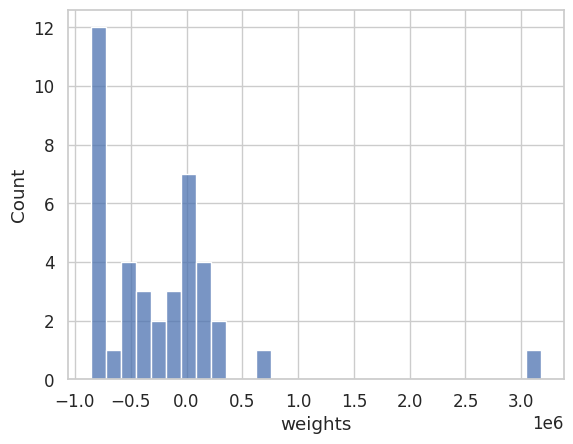

In [334]:
sns.histplot(name_coeffs, bins=30);

Коэффициент при признаке `owner_infrequent_sklearn` получился на порядок больше, чем остальные. Этот признак был создан при OneHot-кодировании для категории _Test Drive Car_; автомобилей с таким значение признака `owner` всего лишь 4. У этих объектов цена очень высокая - 3 из 4-х объектов входят в топ-10  автомобилей с самыми высокими ценами в датасете.

In [335]:
X_train_1['owner'].value_counts()

,count
owner,
First Owner,3590
Second Owner,1637
Third Owner,453
Fourth & Above Owner,139
Test Drive Car,4


In [336]:
y_train_1[X_train_1['owner'] == 'Test Drive Car']

,selling_price
3595,6223000
3596,5923000
3597,6523000
4507,2000000


In [337]:
y_train_1.sort_values(ascending=False)[:10]

,selling_price
151,10000000
2283,7200000
3597,6523000
3595,6223000
121,6000000
871,6000000
3479,6000000
3596,5923000
132,5850000
4534,5830000


In [338]:
df_test_1 = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')
X_test_1, y_test_1 = df_test_1.drop(columns='selling_price'), df_test_1['selling_price']
X_test_1.shape, y_test_1.shape

((1000, 12), (1000,))

In [339]:
# выберем случайные 5 строк из тестового датасета
# и сохраним их в файл, чтобы проверить
# модель в приложении на новых данных

df_test_1.drop(columns='selling_price').sample(5).to_csv('example_car_prices.csv', index=False)

In [340]:
r2_train_ridge_1, mse_train_ridge_1 = evaluate_model(y_train_1, pipeline.predict(X_train_1))

print(f'R^2 (train): {r2_train_ridge_1}\nMSE (train): {mse_train_ridge_1:,}')

R^2 (train): 0.7533133863867634
MSE (train): 70,423,442,006.08551


In [341]:
r2_test_ridge_1, mse_test_ridge_1 = evaluate_model(y_test_1, pipeline.predict(X_test_1))

print(f'R^2 (test): {r2_test_ridge_1}\nMSE (test): {mse_test_ridge_1:,}')

R^2 (test): 0.7402893178297514
MSE (test): 149,289,116,315.79907


Сохраним пайплайн в pickle-файл.

In [342]:
pipeline_dir = 'pipelines'
os.makedirs(pipeline_dir, exist_ok=True)

pipeline_path = os.path.join(pipeline_dir, 'ridge_pipeline.pkl')
with open(pipeline_path, 'wb') as f:
  pickle.dump(pipeline, f, protocol=pickle.HIGHEST_PROTOCOL)

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

**И ссылку на приложение в StreamlitHub.**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.



### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.